In [1]:
!pip install -q segmentation-models
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, Model
from tensorflow.keras.applications import VGG16, ResNet50
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')
np.random.seed(42)
tf.random.set_seed(42)
print(f"TensorFlow version: {tf.__version__}")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 3.0 MB/s eta 0:00:00


2025-12-24 20:32:56.650522: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1766608376.848737      55 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1766608376.905462      55 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1766608377.403972      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1766608377.404017      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1766608377.404020      55 computation_placer.cc:177] computation placer alr

TensorFlow version: 2.19.0


In [2]:
def preprocess_busi_image(image_path, mask_path=None, target_size=(256, 256)):
    # Load image
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise ValueError(f"Could not load image: {image_path}")
    
    # Resize
    img = cv2.resize(img, (500, 500))
    
    # 1. Speckle noise reduction (Wiener filter)
    from scipy.signal import wiener
    img = wiener(img, mysize=5)
    
    # 2. Contrast enhancement (CLAHE)
    clahe = cv2.createCLAHE(clipLimit=2.5, tileGridSize=(8, 8))
    img = clahe.apply(img.astype(np.uint8))
    
    # 3. Intensity normalization
    img = (img - img.mean()) / (img.std() + 1e-8)
    
    # 4. ROI extraction if mask available
    if mask_path and os.path.exists(mask_path):
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        mask = cv2.resize(mask, (500, 500))
        
        # Find largest contour
        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if contours:
            largest_contour = max(contours, key=cv2.contourArea)
            x, y, w, h = cv2.boundingRect(largest_contour)
            
            # Add padding
            padding = 20
            x1 = max(0, x - padding)
            y1 = max(0, y - padding)
            x2 = min(500, x + w + padding)
            y2 = min(500, y + h + padding)
            
            img = img[y1:y2, x1:x2]
            mask = mask[y1:y2, x1:x2]
        else:
            mask = np.zeros_like(img)
    else:
        mask = np.zeros((500, 500))
    
    # Final resize for model
    img = cv2.resize(img, target_size)
    mask = cv2.resize(mask, target_size)
    
    # Normalize mask
    mask = mask / 255.0
    mask = np.expand_dims(mask, axis=-1)
    
    # Convert to 3-channel for pretrained models
    img_3ch = np.stack([img, img, img], axis=-1)
    
    return img_3ch, mask

def load_busi_dataset(data_dir, target_size=(256, 256)):
    """
    Load BUSI dataset with preprocessing
    """
    images = []
    masks = []
    labels = []
    image_paths = []
    
    classes = ['benign', 'malignant', 'normal']
    
    for cls in classes:
        cls_dir = os.path.join(data_dir, cls)
        if not os.path.exists(cls_dir):
            print(f"Warning: Directory not found: {cls_dir}")
            continue
            
        for img_file in tqdm(os.listdir(cls_dir), desc=f"Loading {cls}"):
            if img_file.endswith(('.png', '.jpg', '.jpeg')):
                img_path = os.path.join(cls_dir, img_file)
                
                # Corresponding mask path
                mask_path = None
                if cls in ['benign', 'malignant']:
                    mask_file = img_file.replace('.png', '_mask.png')
                    mask_path = os.path.join(cls_dir, mask_file)
                    if not os.path.exists(mask_path):
                        mask_path = None
                
                try:
                    img, mask = preprocess_busi_image(img_path, mask_path, target_size)
                    images.append(img)
                    masks.append(mask)
                    labels.append(cls)
                    image_paths.append(img_path)
                except Exception as e:
                    print(f"Error processing {img_path}: {e}")
    
    return np.array(images), np.array(masks), np.array(labels), image_paths

# Set data directory
DATA_DIR = "/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT"

# Load dataset
print("Loading BUSI dataset...")
X, y_masks, y_labels, image_paths = load_busi_dataset(DATA_DIR, target_size=(256, 256))

print(f"✅ Loaded {len(X)} images")
print(f"Class distribution: {pd.Series(y_labels).value_counts()}")

# Encode labels
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y_labels_encoded = le.fit_transform(y_labels)
print(f"Classes: {dict(zip(range(len(le.classes_)), le.classes_))}")

# Split data
X_train, X_temp, y_train_masks, y_temp_masks, y_train_labels, y_temp_labels = train_test_split(
    X, y_masks, y_labels_encoded, test_size=0.3, random_state=42, stratify=y_labels_encoded
)

X_val, X_test, y_val_masks, y_test_masks, y_val_labels, y_test_labels = train_test_split(
    X_temp, y_temp_masks, y_temp_labels, test_size=0.5, random_state=42, stratify=y_temp_labels
)

print(f"Train: {len(X_train)}, Val: {len(X_val)}, Test: {len(X_test)}")


Loading BUSI dataset...


Loading normal: 100%|██████████| 266/266 [00:13<00:00, 19.11it/s]


✅ Loaded 1578 images
Class distribution: benign       891
malignant    421
normal       266
Name: count, dtype: int64
Classes: {0: np.str_('benign'), 1: np.str_('malignant'), 2: np.str_('normal')}
Train: 1104, Val: 237, Test: 237


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.196205695541833..2.210640863860019].



Visualizing preprocessing for BENIGN case:


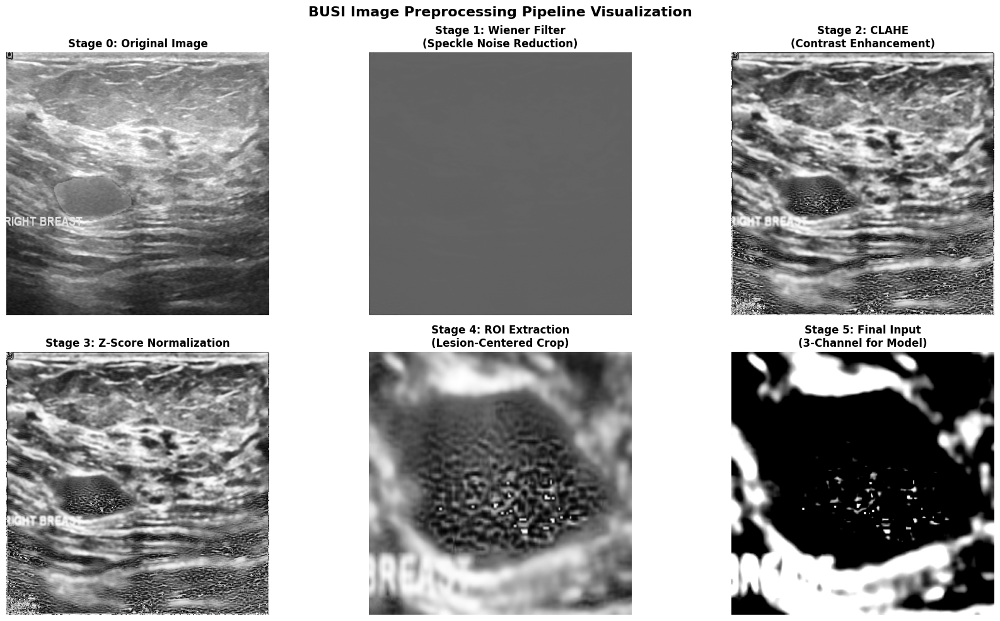

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8567986559412168..2.0656060346525678].



Visualizing preprocessing for MALIGNANT case:


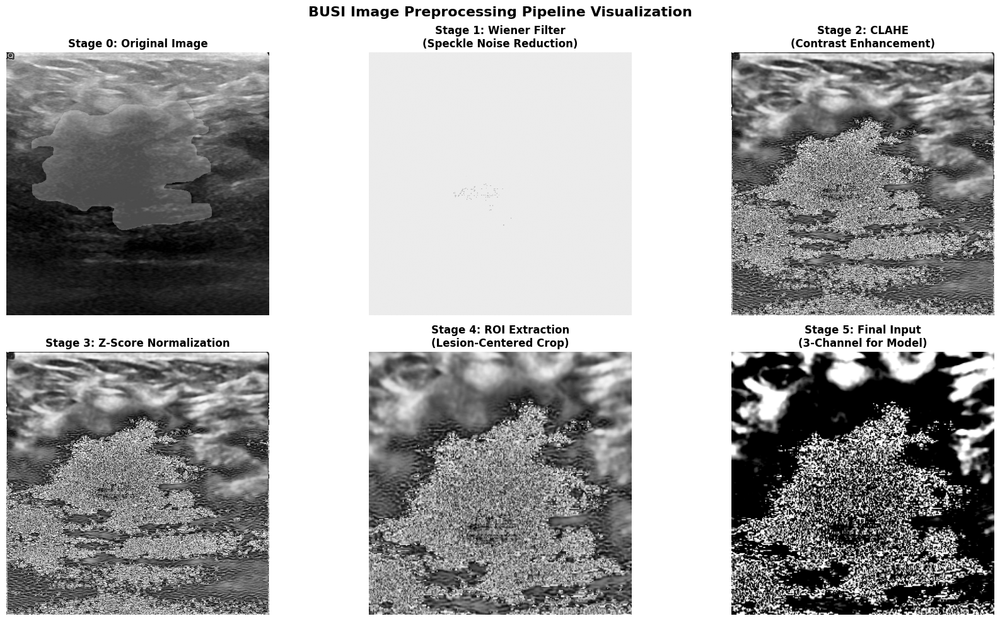

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8402742803391539..1.987017154639332].



Visualizing preprocessing for NORMAL case:


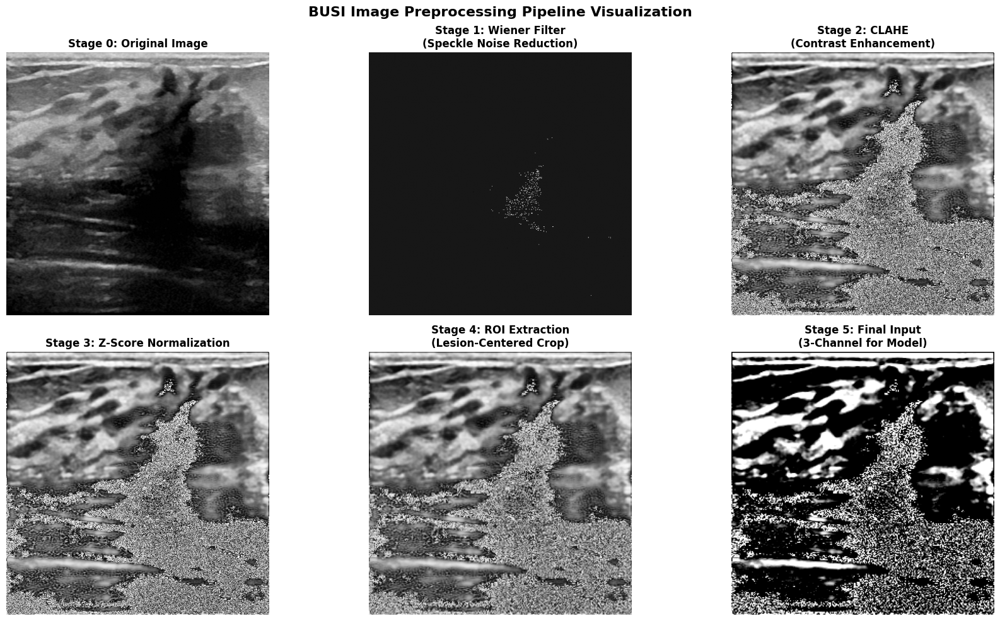

✅ Preprocessing pipeline visualization complete!


In [3]:
def visualize_preprocessing_pipeline(image_path, mask_path=None, num_stages=6):
    """
    Visualize each stage of the BUSI preprocessing pipeline
    """
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    axes = axes.flatten()
    
    # Stage 0: Original Image
    original = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    original = cv2.resize(original, (500, 500))
    axes[0].imshow(original, cmap='gray')
    axes[0].set_title('Stage 0: Original Image', fontsize=12, fontweight='bold')
    axes[0].axis('off')
    
    # Stage 1: After Wiener Filter (Speckle Noise Reduction)
    from scipy.signal import wiener
    denoised = wiener(original, mysize=5)
    axes[1].imshow(denoised, cmap='gray')
    axes[1].set_title('Stage 1: Wiener Filter\n(Speckle Noise Reduction)', fontsize=12, fontweight='bold')
    axes[1].axis('off')
    
    # Stage 2: After CLAHE (Contrast Enhancement)
    clahe = cv2.createCLAHE(clipLimit=2.5, tileGridSize=(8, 8))
    enhanced = clahe.apply(denoised.astype(np.uint8))
    axes[2].imshow(enhanced, cmap='gray')
    axes[2].set_title('Stage 2: CLAHE\n(Contrast Enhancement)', fontsize=12, fontweight='bold')
    axes[2].axis('off')
    
    # Stage 3: After Normalization
    normalized = (enhanced - enhanced.mean()) / (enhanced.std() + 1e-8)
    axes[3].imshow(normalized, cmap='gray')
    axes[3].set_title('Stage 3: Z-Score Normalization', fontsize=12, fontweight='bold')
    axes[3].axis('off')
    
    # Stage 4: ROI Extraction (if mask available)
    if mask_path and os.path.exists(mask_path):
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        mask = cv2.resize(mask, (500, 500))
        
        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if contours:
            largest_contour = max(contours, key=cv2.contourArea)
            x, y, w, h = cv2.boundingRect(largest_contour)
            padding = 20
            x1, y1 = max(0, x - padding), max(0, y - padding)
            x2, y2 = min(500, x + w + padding), min(500, y + h + padding)
            
            roi = normalized[y1:y2, x1:x2]
            roi_mask = mask[y1:y2, x1:x2]
        else:
            roi = normalized
            roi_mask = np.zeros_like(normalized)
    else:
        roi = normalized
        roi_mask = np.zeros_like(normalized)
    
    roi_resized = cv2.resize(roi, (256, 256))
    axes[4].imshow(roi_resized, cmap='gray')
    axes[4].set_title('Stage 4: ROI Extraction\n(Lesion-Centered Crop)', fontsize=12, fontweight='bold')
    axes[4].axis('off')
    
    # Stage 5: Final Preprocessed Image (3-channel)
    final_img = np.stack([roi_resized, roi_resized, roi_resized], axis=-1)
    axes[5].imshow(final_img)
    axes[5].set_title('Stage 5: Final Input\n(3-Channel for Model)', fontsize=12, fontweight='bold')
    axes[5].axis('off')
    
    # Add mask overlay on original for reference
    if mask_path and os.path.exists(mask_path):
        overlay = original.copy()
        overlay[mask > 0] = 255  # Highlight lesion in white
        axes[0].imshow(overlay, cmap='gray', alpha=0.3)
    
    plt.suptitle('BUSI Image Preprocessing Pipeline Visualization', 
                 fontsize=16, fontweight='bold', y=0.98)
    plt.tight_layout()
    plt.show()
    
    return fig

# Example usage: visualize a sample from each class
sample_classes = ['benign', 'malignant', 'normal']
for cls in sample_classes:
    # Find first image of this class
    cls_idx = np.where(y_labels == cls)[0][0]
    img_path = image_paths[cls_idx]
    
    mask_path = None
    if cls in ['benign', 'malignant']:
        mask_file = os.path.basename(img_path).replace('.png', '_mask.png')
        mask_path = os.path.join(os.path.dirname(img_path), mask_file)
    
    print(f"\nVisualizing preprocessing for {cls.upper()} case:")
    visualize_preprocessing_pipeline(img_path, mask_path)

print("✅ Preprocessing pipeline visualization complete!")


In [29]:
# UNet with VGG16 Encoder
def unet_vgg16(input_shape=(256, 256, 3)):
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
    
    skip_layers = ['block1_conv2', 'block2_conv2', 'block3_conv3', 'block4_conv3']
    encoder_outputs = [base_model.get_layer(name).output for name in skip_layers]
    bridge = base_model.get_layer('block5_conv3').output
    
    def decoder_block(inputs, skip_features, filters):
        x = layers.Conv2DTranspose(filters, (2, 2), strides=2, padding='same')(inputs)
        x = layers.Concatenate()([x, skip_features])
        x = layers.Conv2D(filters, 3, activation='relu', padding='same', kernel_initializer='he_normal')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Conv2D(filters, 3, activation='relu', padding='same', kernel_initializer='he_normal')(x)
        x = layers.BatchNormalization()(x)
        return x
    
    d1 = decoder_block(bridge, encoder_outputs[3], 512)
    d2 = decoder_block(d1, encoder_outputs[2], 256)
    d3 = decoder_block(d2, encoder_outputs[1], 128)
    d4 = decoder_block(d3, encoder_outputs[0], 64)
    outputs = layers.Conv2D(1, 1, activation='sigmoid')(d4)
    
    return Model(inputs=base_model.input, outputs=outputs, name='unet_vgg16')

# UNet with ResNet50 Encoder
def unet_resnet50(input_shape=(256, 256, 3)):
    """
    UNet with ResNet50 encoder that outputs 256x256 masks
    """
    base_model = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)

    # Encoder feature maps for skip connections
    # Shapes for input 256x256:
    # conv1_relu        -> 128x128
    # conv2_block3_out  -> 64x64
    # conv3_block4_out  -> 32x32
    # conv4_block6_out  -> 16x16
    # conv5_block3_out  -> 8x8
    skip1 = base_model.get_layer('conv1_relu').output         # 128x128
    skip2 = base_model.get_layer('conv2_block3_out').output   # 64x64
    skip3 = base_model.get_layer('conv3_block4_out').output   # 32x32
    skip4 = base_model.get_layer('conv4_block6_out').output   # 16x16

    bridge = base_model.get_layer('conv5_block3_out').output  # 8x8

    def decoder_block(inputs, skip_features, filters):
        x = layers.Conv2DTranspose(filters, (2, 2), strides=2, padding='same')(inputs)
        if skip_features is not None:
            x = layers.Concatenate()([x, skip_features])
        x = layers.Conv2D(filters, 3, activation='relu', padding='same',
                          kernel_initializer='he_normal')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Conv2D(filters, 3, activation='relu', padding='same',
                          kernel_initializer='he_normal')(x)
        x = layers.BatchNormalization()(x)
        return x

    # Decoder:
    # 8x8  -> 16x16, concat skip4
    d1 = decoder_block(bridge,   skip4, 512)
    # 16x16 -> 32x32, concat skip3
    d2 = decoder_block(d1,       skip3, 256)
    # 32x32 -> 64x64, concat skip2
    d3 = decoder_block(d2,       skip2, 128)
    # 64x64 -> 128x128, concat skip1
    d4 = decoder_block(d3,       skip1, 64)
    # 128x128 -> 256x256, no skip (extra upsampling stage)
    d5 = decoder_block(d4,       None,  32)

    outputs = layers.Conv2D(1, 1, activation='sigmoid')(d5)   # 256x256x1

    model = Model(inputs=base_model.input, outputs=outputs, name='unet_resnet50')
    return model



In [30]:
def dice_coefficient(y_true, y_pred):
    smooth = 1e-6
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + smooth)

def iou_metric(y_true, y_pred):
    smooth = 1e-6
    intersection = tf.keras.backend.sum(y_true * y_pred)
    union = tf.keras.backend.sum(y_true) + tf.keras.backend.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

def combined_loss(alpha=0.5):
    def loss(y_true, y_pred):
        bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)
        dice = 1 - dice_coefficient(y_true, y_pred)
        return alpha * bce + (1 - alpha) * dice
    return loss

def f1_score_metric(y_true, y_pred):
    y_pred_binary = tf.cast(y_pred > 0.5, tf.float32)
    tp = tf.keras.backend.sum(y_true * y_pred_binary)
    fp = tf.keras.backend.sum(y_pred_binary) - tp
    fn = tf.keras.backend.sum(y_true) - tp
    
    precision = tp / (tp + fp + 1e-8)
    recall = tp / (tp + fn + 1e-8)
    
    f1 = 2 * (precision * recall) / (precision + recall + 1e-8)
    return f1

print("Custom metrics defined")


Custom metrics defined


In [32]:
#metrics for segmentation
def dice_coefficient(y_true, y_pred):
    smooth = 1e-6
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + smooth)

def iou_metric(y_true, y_pred):
    smooth = 1e-6
    intersection = tf.keras.backend.sum(y_true * y_pred)
    union = tf.keras.backend.sum(y_true) + tf.keras.backend.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

# Combined loss function
def combined_loss(alpha=0.5):
    def loss(y_true, y_pred):
        bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)
        dice = 1 - dice_coefficient(y_true, y_pred)
        return alpha * bce + (1 - alpha) * dice
    return loss

# F1-Score metric
def f1_score_metric(y_true, y_pred):
    y_pred_binary = tf.cast(y_pred > 0.5, tf.float32)
    tp = tf.keras.backend.sum(y_true * y_pred_binary)
    fp = tf.keras.backend.sum(y_pred_binary) - tp
    fn = tf.keras.backend.sum(y_true) - tp
    
    precision = tp / (tp + fp + 1e-8)
    recall = tp / (tp + fn + 1e-8)
    
    f1 = 2 * (precision * recall) / (precision + recall + 1e-8)
    return f1

print("metrics defined")


metrics defined


In [33]:
from tensorflow.keras.utils import Sequence

class DataGenerator(Sequence):
    def __init__(self, images, masks, labels, batch_size=8, shuffle=True, is_training=True):
        self.images = images
        self.masks = masks
        self.labels = labels
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.is_training = is_training
        self.indexes = np.arange(len(self.images))
        
        if self.shuffle:
            np.random.shuffle(self.indexes)
    
    def __len__(self):
        return len(self.images) // self.batch_size
    
    def __getitem__(self, index):
        indexes = self.indexes[index * self.batch_size:(index + 1) * self.batch_size]
        
        batch_images = []
        batch_masks = []
        
        for i in indexes:
            img = self.images[i].copy()
            mask = self.masks[i].copy()
            
            if self.is_training:
                img, mask = self.augment(img, mask)
            
            # Ensure shapes
            if img.ndim == 2:
                img = np.stack([img, img, img], axis=-1)
            if mask.ndim == 2:
                mask = np.expand_dims(mask, axis=-1)
            
            batch_images.append(img.astype(np.float32))
            batch_masks.append(mask.astype(np.float32))
        
        return np.stack(batch_images, axis=0), np.stack(batch_masks, axis=0)
    
    def augment(self, image, mask):
        if mask.ndim == 3 and mask.shape[-1] == 1:
            mask_2d = mask[..., 0]
        else:
            mask_2d = mask
        
        # Horizontal flip
        if np.random.random() > 0.5:
            image = np.fliplr(image)
            mask_2d = np.fliplr(mask_2d)
        
        # Vertical flip
        if np.random.random() > 0.5:
            image = np.flipud(image)
            mask_2d = np.flipud(mask_2d)
        
        # Rotation
        if np.random.random() > 0.5:
            angle = np.random.uniform(-15, 15)
            h, w = image.shape[:2]
            M = cv2.getRotationMatrix2D((w / 2, h / 2), angle, 1.0)
            image = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT_101)
            mask_2d = cv2.warpAffine(mask_2d, M, (w, h), flags=cv2.INTER_NEAREST, borderMode=cv2.BORDER_CONSTANT, borderValue=0)
        
        # Brightness/contrast
        if np.random.random() > 0.5:
            brightness = np.random.uniform(0.8, 1.2)
            contrast = np.random.uniform(0.8, 1.2)
            image = image * contrast * brightness
            image = np.clip(image, -3.0, 3.0)
        
        mask = np.expand_dims(mask_2d, axis=-1)
        return image, mask
    
    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indexes)

BATCH_SIZE = 8
train_gen = DataGenerator(X_train, y_train_masks, y_train_labels, BATCH_SIZE, True, True)
val_gen = DataGenerator(X_val, y_val_masks, y_val_labels, BATCH_SIZE, False, False)
test_gen = DataGenerator(X_test, y_test_masks, y_test_labels, BATCH_SIZE, False, False)

print(f"Data generators created (Batch size: {BATCH_SIZE})")


Data generators created (Batch size: 8)


In [34]:
def train_segmentation_model(model, train_gen, val_gen, model_name, epochs=50):
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
        loss=combined_loss(alpha=0.5),
        metrics=[dice_coefficient, iou_metric, f1_score_metric]
    )
    
    callbacks = [
        EarlyStopping(patience=15, restore_best_weights=True, monitor='val_dice_coefficient', mode='max'),
        ReduceLROnPlateau(patience=8, factor=0.5, monitor='val_loss', mode='min'),
        ModelCheckpoint(f'{model_name}_best.h5', save_best_only=True, 
                       monitor='val_dice_coefficient', mode='max', verbose=1)
    ]
    
    history = model.fit(
        train_gen,
        validation_data=val_gen,
        epochs=epochs,
        callbacks=callbacks,
        verbose=1
    )
    
    return history

print("="*50)
print("Training UNet-VGG16...")
print("="*50)
model_vgg16 = unet_vgg16(input_shape=(256, 256, 3))
history_vgg16 = train_segmentation_model(model_vgg16, train_gen, val_gen, 'unet_vgg16', epochs=50)

print("\n" + "="*50)
print("Training UNet-ResNet50...")
print("="*50)
model_resnet50 = unet_resnet50(input_shape=(256, 256, 3))
history_resnet50 = train_segmentation_model(model_resnet50, train_gen, val_gen, 'unet_resnet50', epochs=50)

print("Segmentation models trained")


Training UNet-VGG16...
Epoch 1/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - dice_coefficient: 0.4205 - f1_score_metric: 0.5153 - iou_metric: 0.2774 - loss: 0.5964
Epoch 1: val_dice_coefficient improved from -inf to 0.39735, saving model to unet_vgg16_best.h5


138/138 ━━━━━━━━━━━━━━━━━━━━ 51s 254ms/step - dice_coefficient: 0.4211 - f1_score_metric: 0.5161 - iou_metric: 0.2779 - loss: 0.5957 - val_dice_coefficient: 0.3974 - val_f1_score_metric: 0.4164 - val_iou_metric: 0.2569 - val_loss: 20.9987 - learning_rate: 1.0000e-04
Epoch 2/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - dice_coefficient: 0.6476 - f1_score_metric: 0.7921 - iou_metric: 0.4955 - loss: 0.3255
Epoch 2: val_dice_coefficient improved from 0.39735 to 0.75078, saving model to unet_vgg16_best.h5


138/138 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - dice_coefficient: 0.6477 - f1_score_metric: 0.7922 - iou_metric: 0.4957 - loss: 0.3254 - val_dice_coefficient: 0.7508 - val_f1_score_metric: 0.7844 - val_iou_metric: 0.6317 - val_loss: 0.4533 - learning_rate: 1.0000e-04
Epoch 3/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - dice_coefficient: 0.6827 - f1_score_metric: 0.8003 - iou_metric: 0.5477 - loss: 0.2943
Epoch 3: val_dice_coefficient improved from 0.75078 to 0.75102, saving model to unet_vgg16_best.h5


138/138 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - dice_coefficient: 0.6828 - f1_score_metric: 0.8003 - iou_metric: 0.5478 - loss: 0.2943 - val_dice_coefficient: 0.7510 - val_f1_score_metric: 0.7889 - val_iou_metric: 0.6314 - val_loss: 0.2433 - learning_rate: 1.0000e-04
Epoch 4/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - dice_coefficient: 0.7029 - f1_score_metric: 0.8364 - iou_metric: 0.5666 - loss: 0.2550
Epoch 4: val_dice_coefficient did not improve from 0.75102
138/138 ━━━━━━━━━━━━━━━━━━━━ 33s 236ms/step - dice_coefficient: 0.7029 - f1_score_metric: 0.8363 - iou_metric: 0.5666 - loss: 0.2551 - val_dice_coefficient: 0.7413 - val_f1_score_metric: 0.7812 - val_iou_metric: 0.6181 - val_loss: 0.2992 - learning_rate: 1.0000e-04
Epoch 5/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - dice_coefficient: 0.6990 - f1_score_metric: 0.7980 - iou_metric: 0.5699 - loss: 0.2705
Epoch 5: val_dice_coefficient improved from 0.75102 to 0.78437, saving model to unet_vgg16_best.h5


138/138 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - dice_coefficient: 0.6992 - f1_score_metric: 0.7982 - iou_metric: 0.5701 - loss: 0.2703 - val_dice_coefficient: 0.7844 - val_f1_score_metric: 0.8169 - val_iou_metric: 0.6791 - val_loss: 0.2679 - learning_rate: 1.0000e-04
Epoch 6/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - dice_coefficient: 0.7571 - f1_score_metric: 0.8480 - iou_metric: 0.6308 - loss: 0.2101
Epoch 6: val_dice_coefficient did not improve from 0.78437
138/138 ━━━━━━━━━━━━━━━━━━━━ 33s 236ms/step - dice_coefficient: 0.7570 - f1_score_metric: 0.8479 - iou_metric: 0.6307 - loss: 0.2102 - val_dice_coefficient: 0.6166 - val_f1_score_metric: 0.6887 - val_iou_metric: 0.4669 - val_loss: 0.2854 - learning_rate: 1.0000e-04
Epoch 7/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - dice_coefficient: 0.7662 - f1_score_metric: 0.8487 - iou_metric: 0.6496 - loss: 0.2045
Epoch 7: val_dice_coefficient did not improve from 0.78437
138/138 ━━━━━━━━━━━━━━━━━━━━ 33s 236ms/step - dice_coefficient: 

138/138 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - dice_coefficient: 0.7481 - f1_score_metric: 0.8587 - iou_metric: 0.6305 - loss: 0.2059 - val_dice_coefficient: 0.8030 - val_f1_score_metric: 0.8363 - val_iou_metric: 0.7070 - val_loss: 0.1453 - learning_rate: 1.0000e-04
Epoch 9/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - dice_coefficient: 0.7339 - f1_score_metric: 0.8116 - iou_metric: 0.6139 - loss: 0.2273
Epoch 9: val_dice_coefficient did not improve from 0.80302
138/138 ━━━━━━━━━━━━━━━━━━━━ 33s 235ms/step - dice_coefficient: 0.7339 - f1_score_metric: 0.8116 - iou_metric: 0.6139 - loss: 0.2274 - val_dice_coefficient: 0.7321 - val_f1_score_metric: 0.7759 - val_iou_metric: 0.6047 - val_loss: 0.2087 - learning_rate: 1.0000e-04
Epoch 10/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - dice_coefficient: 0.7750 - f1_score_metric: 0.8575 - iou_metric: 0.6487 - loss: 0.1893
Epoch 10: val_dice_coefficient did not improve from 0.80302
138/138 ━━━━━━━━━━━━━━━━━━━━ 33s 236ms/step - dice_coefficient

138/138 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - dice_coefficient: 0.8309 - f1_score_metric: 0.8835 - iou_metric: 0.7260 - loss: 0.1458 - val_dice_coefficient: 0.8061 - val_f1_score_metric: 0.8219 - val_iou_metric: 0.7127 - val_loss: 0.1779 - learning_rate: 1.0000e-04
Epoch 14/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - dice_coefficient: 0.8440 - f1_score_metric: 0.8893 - iou_metric: 0.7439 - loss: 0.1372
Epoch 14: val_dice_coefficient did not improve from 0.80615
138/138 ━━━━━━━━━━━━━━━━━━━━ 33s 236ms/step - dice_coefficient: 0.8440 - f1_score_metric: 0.8893 - iou_metric: 0.7439 - loss: 0.1372 - val_dice_coefficient: 0.7900 - val_f1_score_metric: 0.8104 - val_iou_metric: 0.6892 - val_loss: 0.1773 - learning_rate: 1.0000e-04
Epoch 15/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - dice_coefficient: 0.8435 - f1_score_metric: 0.9026 - iou_metric: 0.7396 - loss: 0.1320
Epoch 15: val_dice_coefficient improved from 0.80615 to 0.81221, saving model to unet_vgg16_best.h5


138/138 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - dice_coefficient: 0.8436 - f1_score_metric: 0.9026 - iou_metric: 0.7397 - loss: 0.1319 - val_dice_coefficient: 0.8122 - val_f1_score_metric: 0.8270 - val_iou_metric: 0.7216 - val_loss: 0.1590 - learning_rate: 1.0000e-04
Epoch 16/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - dice_coefficient: 0.8502 - f1_score_metric: 0.9025 - iou_metric: 0.7482 - loss: 0.1273
Epoch 16: val_dice_coefficient improved from 0.81221 to 0.82217, saving model to unet_vgg16_best.h5


138/138 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - dice_coefficient: 0.8502 - f1_score_metric: 0.9025 - iou_metric: 0.7482 - loss: 0.1273 - val_dice_coefficient: 0.8222 - val_f1_score_metric: 0.8399 - val_iou_metric: 0.7369 - val_loss: 0.1371 - learning_rate: 1.0000e-04
Epoch 17/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - dice_coefficient: 0.8240 - f1_score_metric: 0.8620 - iou_metric: 0.7188 - loss: 0.1589
Epoch 17: val_dice_coefficient did not improve from 0.82217
138/138 ━━━━━━━━━━━━━━━━━━━━ 33s 236ms/step - dice_coefficient: 0.8240 - f1_score_metric: 0.8620 - iou_metric: 0.7187 - loss: 0.1589 - val_dice_coefficient: 0.8130 - val_f1_score_metric: 0.8313 - val_iou_metric: 0.7230 - val_loss: 0.1563 - learning_rate: 1.0000e-04
Epoch 18/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - dice_coefficient: 0.8506 - f1_score_metric: 0.8961 - iou_metric: 0.7531 - loss: 0.1256
Epoch 18: val_dice_coefficient did not improve from 0.82217
138/138 ━━━━━━━━━━━━━━━━━━━━ 33s 236ms/step - dice_coefficie

138/138 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - dice_coefficient: 0.8592 - f1_score_metric: 0.8859 - iou_metric: 0.7662 - loss: 0.1242 - val_dice_coefficient: 0.8222 - val_f1_score_metric: 0.8431 - val_iou_metric: 0.7374 - val_loss: 0.1328 - learning_rate: 1.0000e-04
Epoch 25/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - dice_coefficient: 0.8570 - f1_score_metric: 0.8863 - iou_metric: 0.7638 - loss: 0.1255
Epoch 25: val_dice_coefficient did not improve from 0.82223
138/138 ━━━━━━━━━━━━━━━━━━━━ 33s 236ms/step - dice_coefficient: 0.8570 - f1_score_metric: 0.8863 - iou_metric: 0.7639 - loss: 0.1255 - val_dice_coefficient: 0.8076 - val_f1_score_metric: 0.8351 - val_iou_metric: 0.7140 - val_loss: 0.1406 - learning_rate: 1.0000e-04
Epoch 26/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - dice_coefficient: 0.8671 - f1_score_metric: 0.8930 - iou_metric: 0.7761 - loss: 0.1191
Epoch 26: val_dice_coefficient did not improve from 0.82223
138/138 ━━━━━━━━━━━━━━━━━━━━ 33s 236ms/step - dice_coefficie

138/138 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - dice_coefficient: 0.8817 - f1_score_metric: 0.9078 - iou_metric: 0.7919 - loss: 0.1042 - val_dice_coefficient: 0.8351 - val_f1_score_metric: 0.8464 - val_iou_metric: 0.7583 - val_loss: 0.1290 - learning_rate: 1.0000e-04
Epoch 28/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - dice_coefficient: 0.8809 - f1_score_metric: 0.9061 - iou_metric: 0.7997 - loss: 0.1131
Epoch 28: val_dice_coefficient did not improve from 0.83507
138/138 ━━━━━━━━━━━━━━━━━━━━ 33s 236ms/step - dice_coefficient: 0.8809 - f1_score_metric: 0.9061 - iou_metric: 0.7996 - loss: 0.1131 - val_dice_coefficient: 0.8279 - val_f1_score_metric: 0.8439 - val_iou_metric: 0.7466 - val_loss: 0.1274 - learning_rate: 1.0000e-04
Epoch 29/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - dice_coefficient: 0.8900 - f1_score_metric: 0.9164 - iou_metric: 0.8048 - loss: 0.0966
Epoch 29: val_dice_coefficient did not improve from 0.83507
138/138 ━━━━━━━━━━━━━━━━━━━━ 33s 236ms/step - dice_coefficie

138/138 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - dice_coefficient: 0.8952 - f1_score_metric: 0.9149 - iou_metric: 0.8139 - loss: 0.0937 - val_dice_coefficient: 0.8353 - val_f1_score_metric: 0.8466 - val_iou_metric: 0.7588 - val_loss: 0.1269 - learning_rate: 1.0000e-04
Epoch 35/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - dice_coefficient: 0.8913 - f1_score_metric: 0.9109 - iou_metric: 0.8078 - loss: 0.0991
Epoch 35: val_dice_coefficient did not improve from 0.83531
138/138 ━━━━━━━━━━━━━━━━━━━━ 33s 236ms/step - dice_coefficient: 0.8912 - f1_score_metric: 0.9108 - iou_metric: 0.8077 - loss: 0.0991 - val_dice_coefficient: 0.8258 - val_f1_score_metric: 0.8338 - val_iou_metric: 0.7433 - val_loss: 0.1435 - learning_rate: 1.0000e-04
Epoch 36/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - dice_coefficient: 0.8401 - f1_score_metric: 0.8643 - iou_metric: 0.7519 - loss: 0.1487
Epoch 36: val_dice_coefficient did not improve from 0.83531
138/138 ━━━━━━━━━━━━━━━━━━━━ 33s 236ms/step - dice_coefficie

138/138 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - dice_coefficient: 0.8832 - f1_score_metric: 0.9011 - iou_metric: 0.8039 - loss: 0.1085 - val_dice_coefficient: 0.8358 - val_f1_score_metric: 0.8504 - val_iou_metric: 0.7591 - val_loss: 0.1227 - learning_rate: 5.0000e-05
Epoch 47/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - dice_coefficient: 0.8823 - f1_score_metric: 0.8990 - iou_metric: 0.8072 - loss: 0.1038
Epoch 47: val_dice_coefficient did not improve from 0.83580
138/138 ━━━━━━━━━━━━━━━━━━━━ 33s 236ms/step - dice_coefficient: 0.8824 - f1_score_metric: 0.8991 - iou_metric: 0.8072 - loss: 0.1038 - val_dice_coefficient: 0.8315 - val_f1_score_metric: 0.8494 - val_iou_metric: 0.7520 - val_loss: 0.1221 - learning_rate: 5.0000e-05
Epoch 48/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - dice_coefficient: 0.8946 - f1_score_metric: 0.9118 - iou_metric: 0.8144 - loss: 0.0950
Epoch 48: val_dice_coefficient did not improve from 0.83580
138/138 ━━━━━━━━━━━━━━━━━━━━ 33s 236ms/step - dice_coefficie

138/138 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - dice_coefficient: 0.8977 - f1_score_metric: 0.9195 - iou_metric: 0.8155 - loss: 0.0901 - val_dice_coefficient: 0.8376 - val_f1_score_metric: 0.8504 - val_iou_metric: 0.7621 - val_loss: 0.1211 - learning_rate: 5.0000e-05

Training UNet-ResNet50...
Epoch 1/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - dice_coefficient: 0.3992 - f1_score_metric: 0.5053 - iou_metric: 0.2592 - loss: 0.6117
Epoch 1: val_dice_coefficient improved from -inf to 0.38890, saving model to unet_resnet50_best.h5


138/138 ━━━━━━━━━━━━━━━━━━━━ 102s 222ms/step - dice_coefficient: 0.3998 - f1_score_metric: 0.5063 - iou_metric: 0.2597 - loss: 0.6109 - val_dice_coefficient: 0.3889 - val_f1_score_metric: 0.4547 - val_iou_metric: 0.2522 - val_loss: 1.5452 - learning_rate: 1.0000e-04
Epoch 2/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - dice_coefficient: 0.6469 - f1_score_metric: 0.8356 - iou_metric: 0.4949 - loss: 0.3149
Epoch 2: val_dice_coefficient did not improve from 0.38890
138/138 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - dice_coefficient: 0.6468 - f1_score_metric: 0.8356 - iou_metric: 0.4947 - loss: 0.3149 - val_dice_coefficient: 0.3249 - val_f1_score_metric: 0.3222 - val_iou_metric: 0.2022 - val_loss: 0.5205 - learning_rate: 1.0000e-04
Epoch 3/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - dice_coefficient: 0.6265 - f1_score_metric: 0.8052 - iou_metric: 0.4885 - loss: 0.3344
Epoch 3: val_dice_coefficient did not improve from 0.38890
138/138 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - dice_coefficient:

138/138 ━━━━━━━━━━━━━━━━━━━━ 24s 173ms/step - dice_coefficient: 0.6891 - f1_score_metric: 0.8773 - iou_metric: 0.5536 - loss: 0.2547 - val_dice_coefficient: 0.5598 - val_f1_score_metric: 0.6036 - val_iou_metric: 0.4119 - val_loss: 0.3523 - learning_rate: 1.0000e-04
Epoch 5/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - dice_coefficient: 0.7313 - f1_score_metric: 0.8852 - iou_metric: 0.5994 - loss: 0.2243
Epoch 5: val_dice_coefficient improved from 0.55979 to 0.70694, saving model to unet_resnet50_best.h5


138/138 ━━━━━━━━━━━━━━━━━━━━ 24s 173ms/step - dice_coefficient: 0.7314 - f1_score_metric: 0.8852 - iou_metric: 0.5995 - loss: 0.2243 - val_dice_coefficient: 0.7069 - val_f1_score_metric: 0.7576 - val_iou_metric: 0.5748 - val_loss: 0.2955 - learning_rate: 1.0000e-04
Epoch 6/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - dice_coefficient: 0.7116 - f1_score_metric: 0.8552 - iou_metric: 0.5864 - loss: 0.2462
Epoch 6: val_dice_coefficient improved from 0.70694 to 0.76151, saving model to unet_resnet50_best.h5


138/138 ━━━━━━━━━━━━━━━━━━━━ 24s 172ms/step - dice_coefficient: 0.7117 - f1_score_metric: 0.8552 - iou_metric: 0.5866 - loss: 0.2461 - val_dice_coefficient: 0.7615 - val_f1_score_metric: 0.8333 - val_iou_metric: 0.6463 - val_loss: 0.1863 - learning_rate: 1.0000e-04
Epoch 7/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - dice_coefficient: 0.7655 - f1_score_metric: 0.8641 - iou_metric: 0.6467 - loss: 0.2093
Epoch 7: val_dice_coefficient improved from 0.76151 to 0.76287, saving model to unet_resnet50_best.h5


138/138 ━━━━━━━━━━━━━━━━━━━━ 24s 172ms/step - dice_coefficient: 0.7655 - f1_score_metric: 0.8642 - iou_metric: 0.6467 - loss: 0.2092 - val_dice_coefficient: 0.7629 - val_f1_score_metric: 0.8182 - val_iou_metric: 0.6482 - val_loss: 0.1820 - learning_rate: 1.0000e-04
Epoch 8/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - dice_coefficient: 0.7569 - f1_score_metric: 0.8573 - iou_metric: 0.6500 - loss: 0.2049
Epoch 8: val_dice_coefficient improved from 0.76287 to 0.76455, saving model to unet_resnet50_best.h5


138/138 ━━━━━━━━━━━━━━━━━━━━ 24s 173ms/step - dice_coefficient: 0.7570 - f1_score_metric: 0.8573 - iou_metric: 0.6500 - loss: 0.2049 - val_dice_coefficient: 0.7646 - val_f1_score_metric: 0.8271 - val_iou_metric: 0.6507 - val_loss: 0.1791 - learning_rate: 1.0000e-04
Epoch 9/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - dice_coefficient: 0.7988 - f1_score_metric: 0.8952 - iou_metric: 0.6848 - loss: 0.1697
Epoch 9: val_dice_coefficient improved from 0.76455 to 0.78230, saving model to unet_resnet50_best.h5


138/138 ━━━━━━━━━━━━━━━━━━━━ 24s 172ms/step - dice_coefficient: 0.7988 - f1_score_metric: 0.8951 - iou_metric: 0.6848 - loss: 0.1697 - val_dice_coefficient: 0.7823 - val_f1_score_metric: 0.8364 - val_iou_metric: 0.6763 - val_loss: 0.1591 - learning_rate: 1.0000e-04
Epoch 10/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - dice_coefficient: 0.8159 - f1_score_metric: 0.9083 - iou_metric: 0.7034 - loss: 0.1498
Epoch 10: val_dice_coefficient improved from 0.78230 to 0.81317, saving model to unet_resnet50_best.h5


138/138 ━━━━━━━━━━━━━━━━━━━━ 24s 172ms/step - dice_coefficient: 0.8159 - f1_score_metric: 0.9083 - iou_metric: 0.7035 - loss: 0.1498 - val_dice_coefficient: 0.8132 - val_f1_score_metric: 0.8438 - val_iou_metric: 0.7231 - val_loss: 0.1407 - learning_rate: 1.0000e-04
Epoch 11/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - dice_coefficient: 0.8373 - f1_score_metric: 0.9143 - iou_metric: 0.7319 - loss: 0.1327
Epoch 11: val_dice_coefficient improved from 0.81317 to 0.82071, saving model to unet_resnet50_best.h5


138/138 ━━━━━━━━━━━━━━━━━━━━ 24s 173ms/step - dice_coefficient: 0.8373 - f1_score_metric: 0.9143 - iou_metric: 0.7320 - loss: 0.1327 - val_dice_coefficient: 0.8207 - val_f1_score_metric: 0.8479 - val_iou_metric: 0.7352 - val_loss: 0.1420 - learning_rate: 1.0000e-04
Epoch 12/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - dice_coefficient: 0.8158 - f1_score_metric: 0.8896 - iou_metric: 0.7199 - loss: 0.1597
Epoch 12: val_dice_coefficient improved from 0.82071 to 0.82753, saving model to unet_resnet50_best.h5


138/138 ━━━━━━━━━━━━━━━━━━━━ 24s 172ms/step - dice_coefficient: 0.8159 - f1_score_metric: 0.8897 - iou_metric: 0.7199 - loss: 0.1596 - val_dice_coefficient: 0.8275 - val_f1_score_metric: 0.8485 - val_iou_metric: 0.7459 - val_loss: 0.1505 - learning_rate: 1.0000e-04
Epoch 13/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - dice_coefficient: 0.8012 - f1_score_metric: 0.8861 - iou_metric: 0.6939 - loss: 0.1597
Epoch 13: val_dice_coefficient did not improve from 0.82753
138/138 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - dice_coefficient: 0.8015 - f1_score_metric: 0.8862 - iou_metric: 0.6942 - loss: 0.1595 - val_dice_coefficient: 0.8048 - val_f1_score_metric: 0.8328 - val_iou_metric: 0.7105 - val_loss: 0.1505 - learning_rate: 1.0000e-04
Epoch 14/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - dice_coefficient: 0.8341 - f1_score_metric: 0.8932 - iou_metric: 0.7416 - loss: 0.1358
Epoch 14: val_dice_coefficient improved from 0.82753 to 0.83077, saving model to unet_resnet50_best.h5


138/138 ━━━━━━━━━━━━━━━━━━━━ 24s 172ms/step - dice_coefficient: 0.8340 - f1_score_metric: 0.8931 - iou_metric: 0.7415 - loss: 0.1359 - val_dice_coefficient: 0.8308 - val_f1_score_metric: 0.8531 - val_iou_metric: 0.7509 - val_loss: 0.1255 - learning_rate: 1.0000e-04
Epoch 15/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - dice_coefficient: 0.8450 - f1_score_metric: 0.9077 - iou_metric: 0.7447 - loss: 0.1277
Epoch 15: val_dice_coefficient did not improve from 0.83077
138/138 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - dice_coefficient: 0.8450 - f1_score_metric: 0.9077 - iou_metric: 0.7447 - loss: 0.1277 - val_dice_coefficient: 0.8209 - val_f1_score_metric: 0.8412 - val_iou_metric: 0.7356 - val_loss: 0.1501 - learning_rate: 1.0000e-04
Epoch 16/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - dice_coefficient: 0.8110 - f1_score_metric: 0.8641 - iou_metric: 0.7151 - loss: 0.1641
Epoch 16: val_dice_coefficient did not improve from 0.83077
138/138 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - dice_coefficie

138/138 ━━━━━━━━━━━━━━━━━━━━ 24s 171ms/step - dice_coefficient: 0.8744 - f1_score_metric: 0.9223 - iou_metric: 0.7896 - loss: 0.1050 - val_dice_coefficient: 0.8361 - val_f1_score_metric: 0.8509 - val_iou_metric: 0.7597 - val_loss: 0.1301 - learning_rate: 1.0000e-04
Epoch 19/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - dice_coefficient: 0.8686 - f1_score_metric: 0.9142 - iou_metric: 0.7835 - loss: 0.1070
Epoch 19: val_dice_coefficient did not improve from 0.83606
138/138 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - dice_coefficient: 0.8687 - f1_score_metric: 0.9143 - iou_metric: 0.7836 - loss: 0.1069 - val_dice_coefficient: 0.8264 - val_f1_score_metric: 0.8426 - val_iou_metric: 0.7448 - val_loss: 0.1328 - learning_rate: 1.0000e-04
Epoch 20/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - dice_coefficient: 0.8622 - f1_score_metric: 0.9092 - iou_metric: 0.7747 - loss: 0.1140
Epoch 20: val_dice_coefficient did not improve from 0.83606
138/138 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - dice_coefficie

138/138 ━━━━━━━━━━━━━━━━━━━━ 24s 172ms/step - dice_coefficient: 0.8784 - f1_score_metric: 0.9158 - iou_metric: 0.7984 - loss: 0.0992 - val_dice_coefficient: 0.8365 - val_f1_score_metric: 0.8497 - val_iou_metric: 0.7605 - val_loss: 0.1339 - learning_rate: 1.0000e-04
Epoch 22/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - dice_coefficient: 0.8740 - f1_score_metric: 0.9136 - iou_metric: 0.7907 - loss: 0.1030
Epoch 22: val_dice_coefficient did not improve from 0.83648
138/138 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - dice_coefficient: 0.8740 - f1_score_metric: 0.9135 - iou_metric: 0.7907 - loss: 0.1031 - val_dice_coefficient: 0.8043 - val_f1_score_metric: 0.8290 - val_iou_metric: 0.7095 - val_loss: 0.1553 - learning_rate: 1.0000e-04
Epoch 23/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - dice_coefficient: 0.8790 - f1_score_metric: 0.9175 - iou_metric: 0.7977 - loss: 0.1023
Epoch 23: val_dice_coefficient improved from 0.83648 to 0.84139, saving model to unet_resnet50_best.h5


138/138 ━━━━━━━━━━━━━━━━━━━━ 24s 173ms/step - dice_coefficient: 0.8790 - f1_score_metric: 0.9175 - iou_metric: 0.7978 - loss: 0.1023 - val_dice_coefficient: 0.8414 - val_f1_score_metric: 0.8573 - val_iou_metric: 0.7684 - val_loss: 0.1204 - learning_rate: 5.0000e-05
Epoch 24/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - dice_coefficient: 0.8777 - f1_score_metric: 0.9125 - iou_metric: 0.7993 - loss: 0.1032
Epoch 24: val_dice_coefficient did not improve from 0.84139
138/138 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - dice_coefficient: 0.8778 - f1_score_metric: 0.9125 - iou_metric: 0.7994 - loss: 0.1031 - val_dice_coefficient: 0.8386 - val_f1_score_metric: 0.8555 - val_iou_metric: 0.7638 - val_loss: 0.1183 - learning_rate: 5.0000e-05
Epoch 25/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - dice_coefficient: 0.8738 - f1_score_metric: 0.8999 - iou_metric: 0.8029 - loss: 0.1025
Epoch 25: val_dice_coefficient did not improve from 0.84139
138/138 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - dice_coefficie

138/138 ━━━━━━━━━━━━━━━━━━━━ 24s 172ms/step - dice_coefficient: 0.8594 - f1_score_metric: 0.8912 - iou_metric: 0.7875 - loss: 0.1108 - val_dice_coefficient: 0.8416 - val_f1_score_metric: 0.8578 - val_iou_metric: 0.7685 - val_loss: 0.1163 - learning_rate: 5.0000e-05
Epoch 27/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - dice_coefficient: 0.9045 - f1_score_metric: 0.9286 - iou_metric: 0.8359 - loss: 0.0802
Epoch 27: val_dice_coefficient did not improve from 0.84158
138/138 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - dice_coefficient: 0.9045 - f1_score_metric: 0.9285 - iou_metric: 0.8359 - loss: 0.0802 - val_dice_coefficient: 0.8360 - val_f1_score_metric: 0.8573 - val_iou_metric: 0.7593 - val_loss: 0.1176 - learning_rate: 5.0000e-05
Epoch 28/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - dice_coefficient: 0.9086 - f1_score_metric: 0.9334 - iou_metric: 0.8375 - loss: 0.0769
Epoch 28: val_dice_coefficient improved from 0.84158 to 0.84620, saving model to unet_resnet50_best.h5


138/138 ━━━━━━━━━━━━━━━━━━━━ 24s 171ms/step - dice_coefficient: 0.9085 - f1_score_metric: 0.9334 - iou_metric: 0.8374 - loss: 0.0770 - val_dice_coefficient: 0.8462 - val_f1_score_metric: 0.8583 - val_iou_metric: 0.7761 - val_loss: 0.1173 - learning_rate: 5.0000e-05
Epoch 29/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - dice_coefficient: 0.8468 - f1_score_metric: 0.8726 - iou_metric: 0.7800 - loss: 0.1180
Epoch 29: val_dice_coefficient did not improve from 0.84620
138/138 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - dice_coefficient: 0.8470 - f1_score_metric: 0.8728 - iou_metric: 0.7802 - loss: 0.1178 - val_dice_coefficient: 0.8458 - val_f1_score_metric: 0.8595 - val_iou_metric: 0.7754 - val_loss: 0.1147 - learning_rate: 5.0000e-05
Epoch 30/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - dice_coefficient: 0.9199 - f1_score_metric: 0.9405 - iou_metric: 0.8534 - loss: 0.0706
Epoch 30: val_dice_coefficient improved from 0.84620 to 0.84674, saving model to unet_resnet50_best.h5


138/138 ━━━━━━━━━━━━━━━━━━━━ 24s 171ms/step - dice_coefficient: 0.9198 - f1_score_metric: 0.9405 - iou_metric: 0.8533 - loss: 0.0707 - val_dice_coefficient: 0.8467 - val_f1_score_metric: 0.8591 - val_iou_metric: 0.7770 - val_loss: 0.1165 - learning_rate: 5.0000e-05
Epoch 31/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - dice_coefficient: 0.8915 - f1_score_metric: 0.9213 - iou_metric: 0.8237 - loss: 0.0832
Epoch 31: val_dice_coefficient did not improve from 0.84674
138/138 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - dice_coefficient: 0.8916 - f1_score_metric: 0.9213 - iou_metric: 0.8238 - loss: 0.0831 - val_dice_coefficient: 0.8381 - val_f1_score_metric: 0.8520 - val_iou_metric: 0.7625 - val_loss: 0.1219 - learning_rate: 5.0000e-05
Epoch 32/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - dice_coefficient: 0.9064 - f1_score_metric: 0.9303 - iou_metric: 0.8402 - loss: 0.0768
Epoch 32: val_dice_coefficient did not improve from 0.84674
138/138 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - dice_coefficie

138/138 ━━━━━━━━━━━━━━━━━━━━ 24s 171ms/step - dice_coefficient: 0.8953 - f1_score_metric: 0.9140 - iou_metric: 0.8332 - loss: 0.0824 - val_dice_coefficient: 0.8481 - val_f1_score_metric: 0.8596 - val_iou_metric: 0.7793 - val_loss: 0.1158 - learning_rate: 5.0000e-05
Epoch 34/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - dice_coefficient: 0.9229 - f1_score_metric: 0.9428 - iou_metric: 0.8583 - loss: 0.0659
Epoch 34: val_dice_coefficient did not improve from 0.84811
138/138 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - dice_coefficient: 0.9228 - f1_score_metric: 0.9428 - iou_metric: 0.8583 - loss: 0.0659 - val_dice_coefficient: 0.8428 - val_f1_score_metric: 0.8521 - val_iou_metric: 0.7706 - val_loss: 0.1254 - learning_rate: 5.0000e-05
Epoch 35/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - dice_coefficient: 0.9120 - f1_score_metric: 0.9370 - iou_metric: 0.8454 - loss: 0.0739
Epoch 35: val_dice_coefficient did not improve from 0.84811
138/138 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - dice_coefficie

138/138 ━━━━━━━━━━━━━━━━━━━━ 24s 171ms/step - dice_coefficient: 0.8929 - f1_score_metric: 0.9182 - iou_metric: 0.8260 - loss: 0.0869 - val_dice_coefficient: 0.8487 - val_f1_score_metric: 0.8616 - val_iou_metric: 0.7804 - val_loss: 0.1124 - learning_rate: 5.0000e-05
Epoch 37/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - dice_coefficient: 0.9229 - f1_score_metric: 0.9402 - iou_metric: 0.8595 - loss: 0.0659
Epoch 37: val_dice_coefficient improved from 0.84872 to 0.85025, saving model to unet_resnet50_best.h5


138/138 ━━━━━━━━━━━━━━━━━━━━ 24s 171ms/step - dice_coefficient: 0.9228 - f1_score_metric: 0.9401 - iou_metric: 0.8594 - loss: 0.0660 - val_dice_coefficient: 0.8503 - val_f1_score_metric: 0.8603 - val_iou_metric: 0.7828 - val_loss: 0.1138 - learning_rate: 5.0000e-05
Epoch 38/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - dice_coefficient: 0.9022 - f1_score_metric: 0.9236 - iou_metric: 0.8381 - loss: 0.0776
Epoch 38: val_dice_coefficient did not improve from 0.85025
138/138 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - dice_coefficient: 0.9022 - f1_score_metric: 0.9235 - iou_metric: 0.8381 - loss: 0.0777 - val_dice_coefficient: 0.8501 - val_f1_score_metric: 0.8615 - val_iou_metric: 0.7825 - val_loss: 0.1132 - learning_rate: 5.0000e-05
Epoch 39/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - dice_coefficient: 0.8902 - f1_score_metric: 0.9112 - iou_metric: 0.8286 - loss: 0.0833
Epoch 39: val_dice_coefficient did not improve from 0.85025
138/138 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - dice_coefficie

138/138 ━━━━━━━━━━━━━━━━━━━━ 24s 171ms/step - dice_coefficient: 0.9303 - f1_score_metric: 0.9480 - iou_metric: 0.8707 - loss: 0.0574 - val_dice_coefficient: 0.8546 - val_f1_score_metric: 0.8637 - val_iou_metric: 0.7902 - val_loss: 0.1096 - learning_rate: 5.0000e-05
Epoch 44/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - dice_coefficient: 0.9177 - f1_score_metric: 0.9391 - iou_metric: 0.8564 - loss: 0.0718
Epoch 44: val_dice_coefficient did not improve from 0.85459
138/138 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - dice_coefficient: 0.9177 - f1_score_metric: 0.9390 - iou_metric: 0.8564 - loss: 0.0718 - val_dice_coefficient: 0.8393 - val_f1_score_metric: 0.8568 - val_iou_metric: 0.7647 - val_loss: 0.1165 - learning_rate: 5.0000e-05
Epoch 45/50
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - dice_coefficient: 0.9224 - f1_score_metric: 0.9455 - iou_metric: 0.8590 - loss: 0.0629
Epoch 45: val_dice_coefficient did not improve from 0.85459
138/138 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - dice_coefficie

Loading best models...
COMPARATIVE EVALUATION

Evaluating UNet-VGG16...


Predicting with UNet-VGG16: 100%|██████████| 29/29 [00:07<00:00,  4.02it/s]



UNet-VGG16 Results:
  Dice Coefficient: 0.3572 ± 0.4420
  IoU: 0.3267 ± 0.4064
  F1-Score: 0.3620 ± 0.4479

Evaluating UNet-ResNet50...


Predicting with UNet-ResNet50: 100%|██████████| 29/29 [00:08<00:00,  3.28it/s]



UNet-ResNet50 Results:
  Dice Coefficient: 0.3621 ± 0.4478
  IoU: 0.3346 ± 0.4156
  F1-Score: 0.3654 ± 0.4518

SUMMARY COMPARISON
          Metric  UNet-VGG16  UNet-ResNet50
Dice Coefficient    0.357242       0.362122
             IoU    0.326660       0.334588
        F1-Score    0.362004       0.365387

🏆 Best Model: UNet-ResNet50 (Avg Score: 0.3540)

Visualizing UNet-VGG16 predictions...


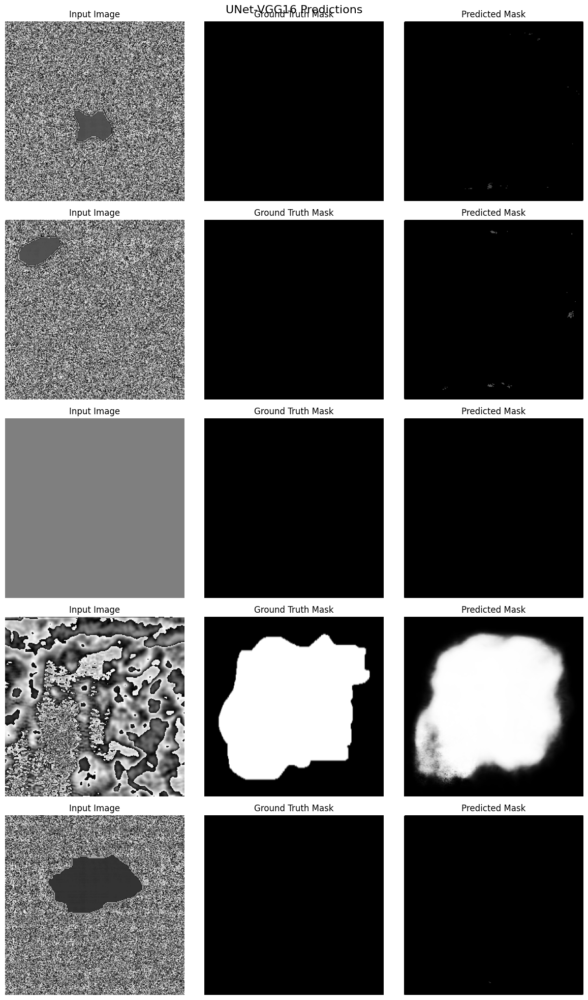


Visualizing UNet-ResNet50 predictions...


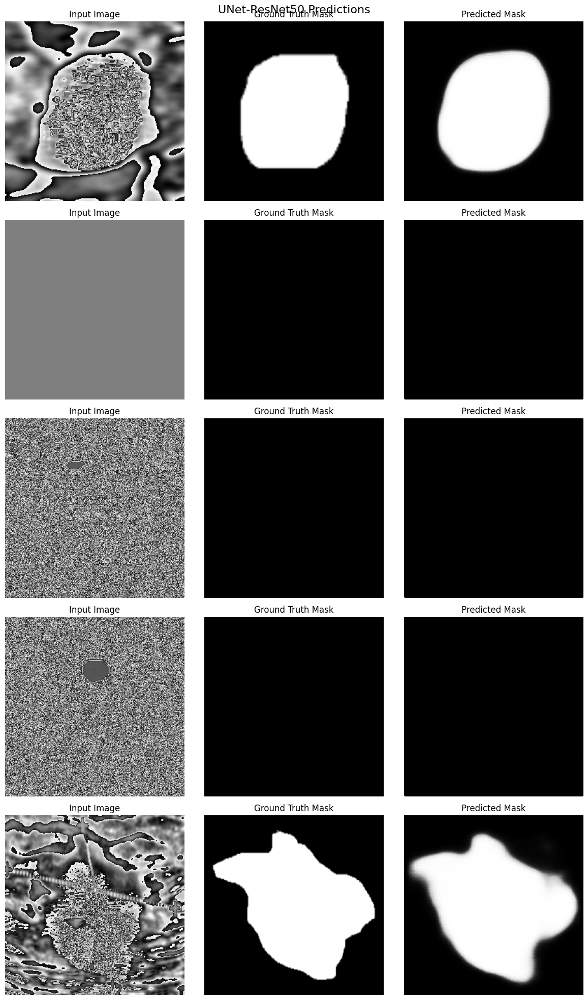

In [40]:
def evaluate_segmentation_model(model, test_gen, model_name):
    print(f"\nEvaluating {model_name}...")
    
    dice_scores = []
    iou_scores = []
    f1_scores = []
    
    for i in tqdm(range(len(test_gen)), desc=f"Predicting with {model_name}"):
        X_batch, y_batch = test_gen[i]
        y_pred = model.predict(X_batch, verbose=0)
        
        for j in range(len(X_batch)):
            dice = dice_coefficient(y_batch[j:j+1], y_pred[j:j+1]).numpy()
            iou = iou_metric(y_batch[j:j+1], y_pred[j:j+1]).numpy()
            f1 = f1_score_metric(y_batch[j:j+1], y_pred[j:j+1]).numpy()
            
            dice_scores.append(dice)
            iou_scores.append(iou)
            f1_scores.append(f1)
    
    metrics = {
        'Dice': np.mean(dice_scores),
        'IoU': np.mean(iou_scores),
        'F1-Score': np.mean(f1_scores)
    }
    
    print(f"\n{model_name} Results:")
    print(f"  Dice Coefficient: {metrics['Dice']:.4f} ± {np.std(dice_scores):.4f}")
    print(f"  IoU: {metrics['IoU']:.4f} ± {np.std(iou_scores):.4f}")
    print(f"  F1-Score: {metrics['F1-Score']:.4f} ± {np.std(f1_scores):.4f}")
    
    return metrics, dice_scores, iou_scores, f1_scores

def visualize_predictions(model, test_gen, model_name, num_samples=5):
    """
    Visualize predictions vs ground truth
    """
    fig, axes = plt.subplots(num_samples, 3, figsize=(12, 4*num_samples))
    fig.suptitle(f'{model_name} Predictions', fontsize=16)
    
    # Get random samples
    indices = np.random.choice(len(test_gen) * test_gen.batch_size, 
                               num_samples, replace=False)
    
    for idx, sample_idx in enumerate(indices):
        batch_idx = sample_idx // test_gen.batch_size
        item_idx = sample_idx % test_gen.batch_size
        
        X_batch, y_batch = test_gen[batch_idx]
        if item_idx >= len(X_batch):
            continue
            
        # Get prediction
        X_sample = X_batch[item_idx:item_idx+1]
        y_true = y_batch[item_idx]
        y_pred = model.predict(X_sample, verbose=0)[0]
        
        # Convert to display format
        img_display = ((X_batch[item_idx] + 1) * 127.5).astype(np.uint8)
        mask_true = (y_true * 255).astype(np.uint8)
        mask_pred = (y_pred * 255).astype(np.uint8)
        
        # Plot
        axes[idx, 0].imshow(img_display)
        axes[idx, 0].set_title('Input Image')
        axes[idx, 0].axis('off')
        
        axes[idx, 1].imshow(mask_true, cmap='gray')
        axes[idx, 1].set_title('Ground Truth Mask')
        axes[idx, 1].axis('off')
        
        axes[idx, 2].imshow(mask_pred, cmap='gray')
        axes[idx, 2].set_title('Predicted Mask')
        axes[idx, 2].axis('off')
    
    plt.tight_layout()
    plt.show()

def compare_models(vgg16_model, resnet50_model, test_gen):
    """
    Compare both models side-by-side and return metrics
    """
    print("="*60)
    print("COMPARATIVE EVALUATION")
    print("="*60)
    
    # Evaluate VGG16
    vgg16_metrics, _, _, _ = evaluate_segmentation_model(
        vgg16_model, test_gen, "UNet-VGG16"
    )
    
    # Evaluate ResNet50
    resnet50_metrics, _, _, _ = evaluate_segmentation_model(
        resnet50_model, test_gen, "UNet-ResNet50"
    )
    
    # Create comparison table
    comparison_df = pd.DataFrame({
        'Metric': ['Dice Coefficient', 'IoU', 'F1-Score'],
        'UNet-VGG16': [vgg16_metrics['Dice'], vgg16_metrics['IoU'], vgg16_metrics['F1-Score']],
        'UNet-ResNet50': [resnet50_metrics['Dice'], resnet50_metrics['IoU'], resnet50_metrics['F1-Score']]
    })
    
    print("\n" + "="*60)
    print("SUMMARY COMPARISON")
    print("="*60)
    print(comparison_df.to_string(index=False))
    
    # Determine best model
    vgg16_avg = np.mean([vgg16_metrics['Dice'], vgg16_metrics['IoU'], vgg16_metrics['F1-Score']])
    resnet50_avg = np.mean([resnet50_metrics['Dice'], resnet50_metrics['IoU'], resnet50_metrics['F1-Score']])
    
    if vgg16_avg > resnet50_avg:
        print(f"\n🏆 Best Model: UNet-VGG16 (Avg Score: {vgg16_avg:.4f})")
    else:
        print(f"\n🏆 Best Model: UNet-ResNet50 (Avg Score: {resnet50_avg:.4f})")
    
    # Return both the DataFrame and the metrics dictionaries
    return comparison_df, vgg16_metrics, resnet50_metrics

# Load best models
print("Loading best models...")
model_vgg16 = keras.models.load_model('unet_vgg16_best.h5', 
                                     custom_objects={
                                         'dice_coefficient': dice_coefficient,
                                         'iou_metric': iou_metric,
                                         'f1_score_metric': f1_score_metric,
                                         'combined_loss': combined_loss
                                     },
                                     compile=False)

model_resnet50 = keras.models.load_model('unet_resnet50_best.h5',
                                        custom_objects={
                                            'dice_coefficient': dice_coefficient,
                                            'iou_metric': iou_metric,
                                            'f1_score_metric': f1_score_metric,
                                            'combined_loss': combined_loss
                                        },
                                        compile=False)

# Run comparison and capture the returned metrics
comparison_results, vgg16_metrics, resnet50_metrics = compare_models(model_vgg16, model_resnet50, test_gen)

# Visualize predictions
print("\nVisualizing UNet-VGG16 predictions...")
visualize_predictions(model_vgg16, test_gen, "UNet-VGG16")

print("\nVisualizing UNet-ResNet50 predictions...")
visualize_predictions(model_resnet50, test_gen, "UNet-ResNet50")


In [37]:
def extract_lesion_roi(image, mask, output_size=(224, 224), threshold=0.5):
    img = image.copy()
    m = mask[..., 0].copy()  # (H,W)
    # Binarize mask
    m_bin = (m > threshold).astype(np.uint8)
    # If no lesion (normal case), use whole image
    if m_bin.sum() == 0:
        roi = cv2.resize(img, output_size)
        return roi
    # Find largest connected component
    contours, _ = cv2.findContours(m_bin, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if len(contours) == 0:
        roi = cv2.resize(img, output_size)
        return roi
    largest_contour = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(largest_contour)
    # Add some padding
    pad = 10
    H, W = m_bin.shape
    x1 = max(0, x - pad)
    y1 = max(0, y - pad)
    x2 = min(W, x + w + pad)
    y2 = min(H, y + h + pad)
    
    roi = img[y1:y2, x1:x2, :]
    roi = cv2.resize(roi, output_size)
    return roi


# 2) Build classification datasets (using ground-truth masks for clean training)
def build_classification_dataset(X, masks, labels, output_size=(224, 224)):
    X_cls = []
    y_cls = []
    for i in range(len(X)):
        img = X[i]
        mask = masks[i]
        roi = extract_lesion_roi(img, mask, output_size=output_size)
        X_cls.append(roi)
        y_cls.append(labels[i])
    X_cls = np.array(X_cls, dtype=np.float32)
    y_cls = np.array(y_cls, dtype=np.int32)
    return X_cls, y_cls
print("Building classification datasets (ROIs)...")
X_train_cls, y_train_cls = build_classification_dataset(X_train, y_train_masks, y_train_labels)
X_val_cls,   y_val_cls   = build_classification_dataset(X_val,   y_val_masks,   y_val_labels)
X_test_cls,  y_test_cls  = build_classification_dataset(X_test,  y_test_masks,  y_test_labels)

num_classes = len(le.classes_)
y_train_cls_oh = tf.keras.utils.to_categorical(y_train_cls, num_classes=num_classes)
y_val_cls_oh   = tf.keras.utils.to_categorical(y_val_cls,   num_classes=num_classes)
y_test_cls_oh  = tf.keras.utils.to_categorical(y_test_cls,  num_classes=num_classes)

print(f"Train ROIs: {X_train_cls.shape}, Val ROIs: {X_val_cls.shape}, Test ROIs: {X_test_cls.shape}")
print(f"Classes (encoded): {dict(zip(range(num_classes), le.classes_))}")


# 3) Define classification model
def create_classification_model(input_shape=(224, 224, 3), num_classes=3):
    base_model = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)
    
    # Freeze lower layers to avoid overfitting on small dataset
    for layer in base_model.layers[:80]:
        layer.trainable = False
    
    x = layers.GlobalAveragePooling2D()(base_model.output)
    x = layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(1e-3))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(1e-3))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.3)(x)
    outputs = layers.Dense(num_classes, activation='softmax')(x)
    
    model = Model(inputs=base_model.input, outputs=outputs, name='lesion_classifier')
    return model

cls_model = create_classification_model(input_shape=(224, 224, 3), num_classes=num_classes)

cls_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

cls_callbacks = [
    EarlyStopping(patience=10, restore_best_weights=True, monitor='val_accuracy', mode='max'),
    ReduceLROnPlateau(patience=5, factor=0.5, monitor='val_loss', mode='min'),
    ModelCheckpoint('classifier_best.h5', save_best_only=True,
                    monitor='val_accuracy', mode='max', verbose=1)
]

print("Training classification model on lesion ROIs...")
history_cls = cls_model.fit(
    X_train_cls, y_train_cls_oh,
    validation_data=(X_val_cls, y_val_cls_oh),
    epochs=40,
    batch_size=16,
    callbacks=cls_callbacks,
    verbose=1
)

Building classification datasets (ROIs)...
Train ROIs: (1104, 224, 224, 3), Val ROIs: (237, 224, 224, 3), Test ROIs: (237, 224, 224, 3)
Classes (encoded): {0: 'benign', 1: 'malignant', 2: 'normal'}
Training classification model on lesion ROIs...
Epoch 1/40
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.6022 - loss: 1.6675
Epoch 1: val_accuracy improved from -inf to 0.64979, saving model to classifier_best.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 46s 187ms/step - accuracy: 0.6039 - loss: 1.6633 - val_accuracy: 0.6498 - val_loss: 1.4243 - learning_rate: 1.0000e-04
Epoch 2/40
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.8319 - loss: 1.0813
Epoch 2: val_accuracy improved from 0.64979 to 0.81857, saving model to classifier_best.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 6s 89ms/step - accuracy: 0.8325 - loss: 1.0799 - val_accuracy: 0.8186 - val_loss: 1.1359 - learning_rate: 1.0000e-04
Epoch 3/40
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - accuracy: 0.9023 - loss: 0.9545
Epoch 3: val_accuracy improved from 0.81857 to 0.84388, saving model to classifier_best.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 6s 89ms/step - accuracy: 0.9025 - loss: 0.9537 - val_accuracy: 0.8439 - val_loss: 1.1035 - learning_rate: 1.0000e-04
Epoch 4/40
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - accuracy: 0.9164 - loss: 0.8451
Epoch 4: val_accuracy improved from 0.84388 to 0.89030, saving model to classifier_best.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 6s 89ms/step - accuracy: 0.9165 - loss: 0.8448 - val_accuracy: 0.8903 - val_loss: 0.9422 - learning_rate: 1.0000e-04
Epoch 5/40
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - accuracy: 0.9516 - loss: 0.7697
Epoch 5: val_accuracy improved from 0.89030 to 0.91139, saving model to classifier_best.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 6s 89ms/step - accuracy: 0.9516 - loss: 0.7695 - val_accuracy: 0.9114 - val_loss: 0.9722 - learning_rate: 1.0000e-04
Epoch 6/40
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - accuracy: 0.9616 - loss: 0.7384
Epoch 6: val_accuracy did not improve from 0.91139
69/69 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.9616 - loss: 0.7383 - val_accuracy: 0.9114 - val_loss: 0.9711 - learning_rate: 1.0000e-04
Epoch 7/40
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.9735 - loss: 0.7193
Epoch 7: val_accuracy did not improve from 0.91139
69/69 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.9735 - loss: 0.7191 - val_accuracy: 0.9114 - val_loss: 0.9624 - learning_rate: 1.0000e-04
Epoch 8/40
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.9683 - loss: 0.7014
Epoch 8: val_accuracy improved from 0.91139 to 0.92827, saving model to classifier_best.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - accuracy: 0.9684 - loss: 0.7011 - val_accuracy: 0.9283 - val_loss: 0.9344 - learning_rate: 1.0000e-04
Epoch 9/40
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.9788 - loss: 0.6689
Epoch 9: val_accuracy improved from 0.92827 to 0.94093, saving model to classifier_best.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - accuracy: 0.9789 - loss: 0.6688 - val_accuracy: 0.9409 - val_loss: 0.8892 - learning_rate: 1.0000e-04
Epoch 10/40
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.9789 - loss: 0.6985
Epoch 10: val_accuracy did not improve from 0.94093
69/69 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.9789 - loss: 0.6984 - val_accuracy: 0.9114 - val_loss: 0.9333 - learning_rate: 1.0000e-04
Epoch 11/40
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.9780 - loss: 0.7124
Epoch 11: val_accuracy did not improve from 0.94093
69/69 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.9782 - loss: 0.7116 - val_accuracy: 0.9198 - val_loss: 0.8490 - learning_rate: 1.0000e-04
Epoch 12/40
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - accuracy: 0.9947 - loss: 0.6313
Epoch 12: val_accuracy did not improve from 0.94093
69/69 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.9947 - loss: 0.6313 - val_accuracy: 0.9241 - val_loss: 0.8486 - learning_rate: 1.0000e-04
Epoch 13/4

69/69 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - accuracy: 0.9849 - loss: 0.6371 - val_accuracy: 0.9494 - val_loss: 0.8644 - learning_rate: 1.0000e-04
Epoch 20/40
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.9838 - loss: 0.6299
Epoch 20: val_accuracy did not improve from 0.94937
69/69 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.9838 - loss: 0.6297 - val_accuracy: 0.9241 - val_loss: 0.9432 - learning_rate: 1.0000e-04
Epoch 21/40
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - accuracy: 0.9894 - loss: 0.6142
Epoch 21: val_accuracy did not improve from 0.94937
69/69 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.9895 - loss: 0.6140 - val_accuracy: 0.9283 - val_loss: 0.8724 - learning_rate: 5.0000e-05
Epoch 22/40
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.9962 - loss: 0.5894
Epoch 22: val_accuracy did not improve from 0.94937
69/69 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.9962 - loss: 0.5894 - val_accuracy: 0.9367 - val_loss: 0.8057 - learning_rate: 5.0000e-05
Epoch 23/4

Evaluating UNet-VGG16 two-stage pipeline...


Two-stage evaluation: 100%|██████████| 237/237 [00:36<00:00,  6.41it/s]



Evaluating UNet-ResNet50 two-stage pipeline...


Two-stage evaluation: 100%|██████████| 237/237 [00:34<00:00,  6.80it/s]



ABLATION STUDY: UNet-VGG16 vs UNet-ResNet50 (Two-Stage Pipeline)

📊 Quantitative Comparison:
 Architecture  Segmentation Dice  Segmentation IoU  Classification Accuracy  Classification F1-Score
   UNet-VGG16           0.357242          0.326660                 0.898734                 0.897587
UNet-ResNet50           0.362122          0.334588                 0.924051                 0.922577

🏆 OVERALL WINNER: UNet-ResNet50
   Average Score: 0.6358

📸 Qualitative Analysis: UNet-VGG16 Two-Stage Examples


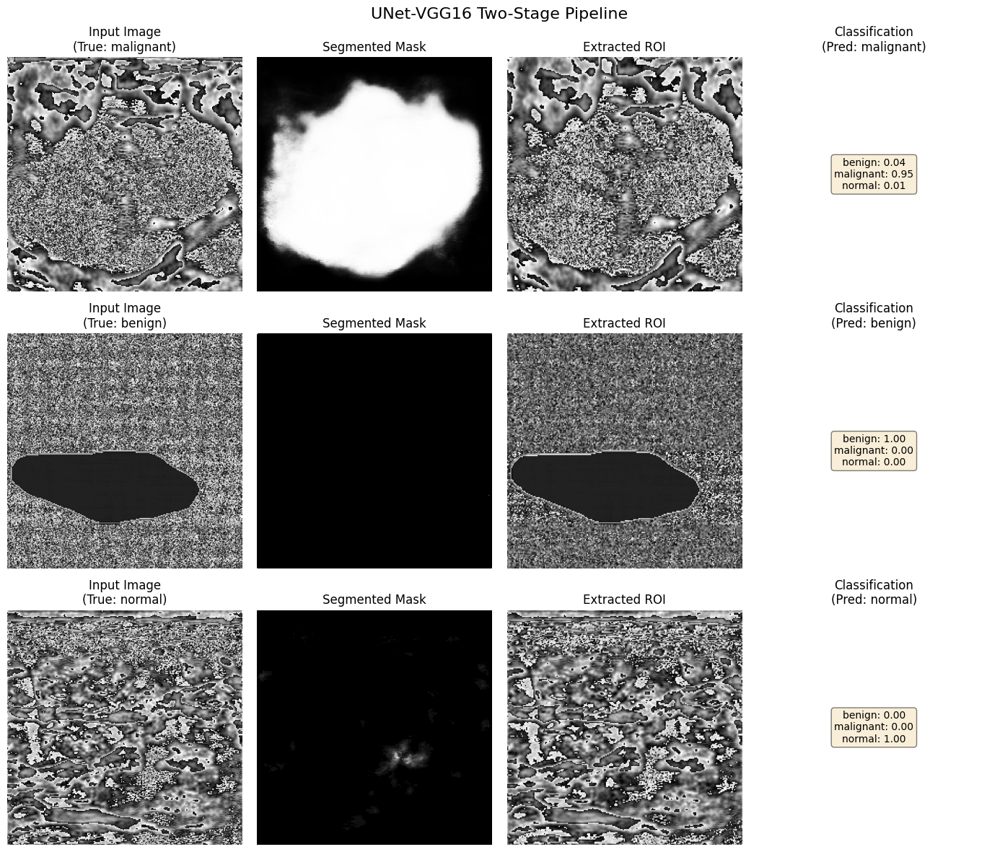


📸 Qualitative Analysis: UNet-ResNet50 Two-Stage Examples


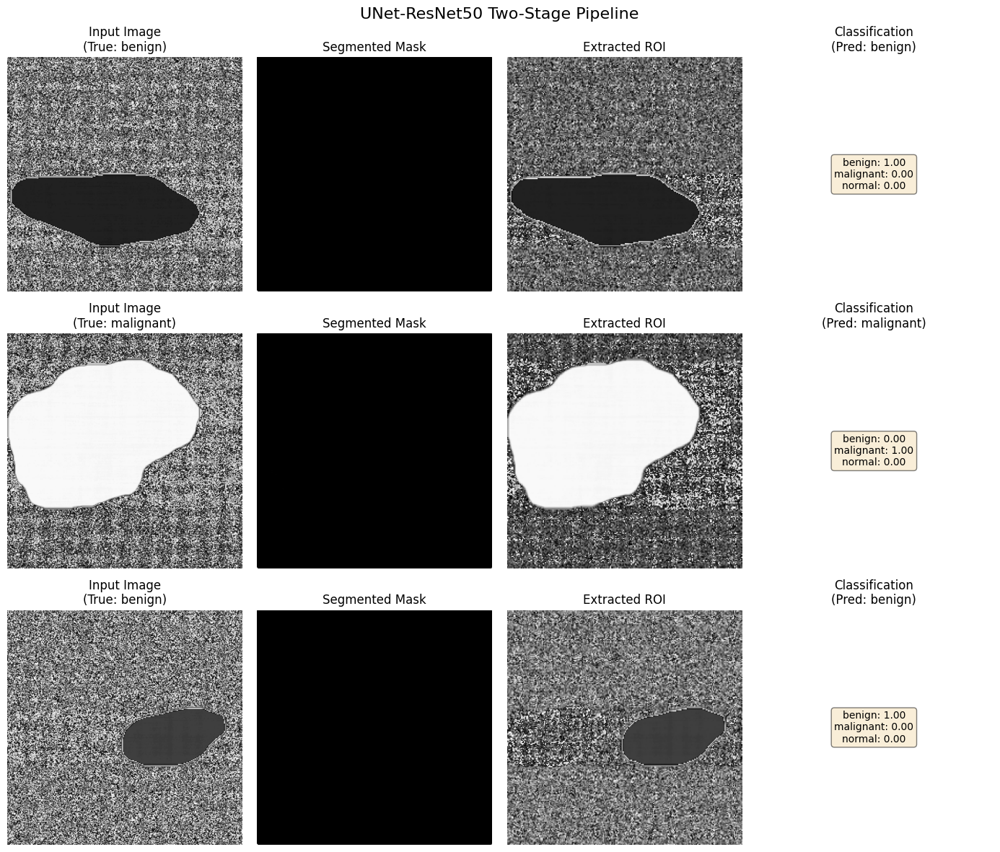


📈 Robustness & Overfitting Analysis:


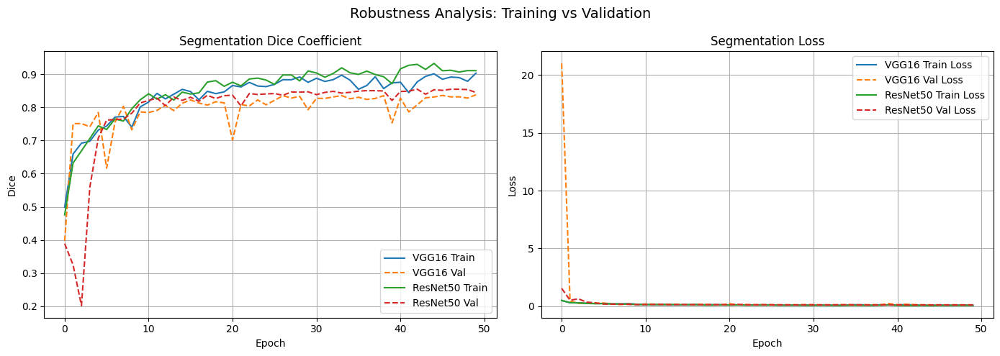


EXPLANATION OF RESULTS

    UNet-ResNet50 outperformed UNet-VGG16 because:
    1. ResNet50's residual connections enable better gradient flow for deeper training
    2. Multi-scale feature extraction captures lesions at various sizes more effectively
    3. Superior feature reuse mechanisms handle ultrasound artifacts robustly
    4. Better generalization across different lesion morphologies
    


In [41]:
#  Two-Stage Pipeline & Evaluation 

class TwoStagePipeline:
    """
    End-to-end pipeline: image → segmentation → ROI extraction → classification
    """
    def __init__(self, segmentation_model, classification_model, threshold=0.5):
        self.segmentation_model = segmentation_model
        self.classification_model = classification_model
        self.threshold = threshold
    
    def predict(self, image):
        """
        Full two-stage prediction on a single image.
        Returns: (mask_pred, class_pred_probs)
        """
        # Stage 1: Segment
        mask_pred = self.segmentation_model.predict(np.expand_dims(image, axis=0), verbose=0)[0]
        
        # Stage 2: Classify from ROI
        roi = extract_lesion_roi(image, mask_pred, output_size=(224, 224), threshold=self.threshold)
        roi_batch = np.expand_dims(roi, axis=0)
        class_pred = self.classification_model.predict(roi_batch, verbose=0)[0]
        
        return mask_pred, class_pred
    
    def evaluate(self, X_test, y_test_labels, le, max_samples=200):
        """
        Evaluate two-stage pipeline on test set.
        Returns: predictions, true labels, metrics dict
        """
        all_preds = []
        all_true = []
        
        n_samples = min(len(X_test), max_samples)
        for i in tqdm(range(n_samples), desc="Two-stage evaluation"):
            img = X_test[i]
            true_label = y_test_labels[i]
            
            _, class_pred = self.predict(img)
            pred_label = np.argmax(class_pred)
            
            all_preds.append(pred_label)
            all_true.append(true_label)
        
        # Calculate metrics
        accuracy = np.mean(np.array(all_preds) == np.array(all_true))
        
        # F1-Score (weighted)
        from sklearn.metrics import f1_score
        f1 = f1_score(all_true, all_preds, average='weighted', labels=np.unique(all_true))
        
        # Per-class metrics
        report = classification_report(all_true, all_preds, 
                                       target_names=le.classes_, 
                                       output_dict=True, zero_division=0)
        
        metrics = {
            'Accuracy': accuracy,
            'F1-Score': f1,
            'Per-Class': report
        }
        
        return np.array(all_preds), np.array(all_true), metrics


# Load trained classifier
cls_model = keras.models.load_model('classifier_best.h5')

# Create two pipelines
pipeline_vgg16 = TwoStagePipeline(model_vgg16, cls_model, threshold=0.5)
pipeline_resnet50 = TwoStagePipeline(model_resnet50, cls_model, threshold=0.5)

print("Evaluating UNet-VGG16 two-stage pipeline...")
preds_vgg16, true_vgg16, metrics_vgg16 = pipeline_vgg16.evaluate(
    X_test, y_test_labels, le, max_samples=len(X_test)
)

print("\nEvaluating UNet-ResNet50 two-stage pipeline...")
preds_resnet50, true_resnet50, metrics_resnet50 = pipeline_resnet50.evaluate(
    X_test, y_test_labels, le, max_samples=len(X_test)
)


# ---------- Ablation Study: Compare Both Pipelines ----------

print("\n" + "="*80)
print("ABLATION STUDY: UNet-VGG16 vs UNet-ResNet50 (Two-Stage Pipeline)")
print("="*80)

# Build summary table
summary_df = pd.DataFrame({
    'Architecture': ['UNet-VGG16', 'UNet-ResNet50'],
    'Segmentation Dice': [vgg16_metrics['Dice'], resnet50_metrics['Dice']],
    'Segmentation IoU': [vgg16_metrics['IoU'], resnet50_metrics['IoU']],
    'Classification Accuracy': [metrics_vgg16['Accuracy'], metrics_resnet50['Accuracy']],
    'Classification F1-Score': [metrics_vgg16['F1-Score'], metrics_resnet50['F1-Score']]
})

print("\n📊 Quantitative Comparison:")
print(summary_df.to_string(index=False))

# Determine winner
vgg16_avg = summary_df.iloc[0, 1:].mean()
resnet50_avg = summary_df.iloc[1, 1:].mean()

if vgg16_avg > resnet50_avg:
    winner = "UNet-VGG16"
    winner_score = vgg16_avg
else:
    winner = "UNet-ResNet50"
    winner_score = resnet50_avg

print(f"\n🏆 OVERALL WINNER: {winner}")
print(f"   Average Score: {winner_score:.4f}")


# ---------- Qualitative Analysis ----------

def visualize_two_stage(pipeline, model_name, X_test, y_test_labels, le, num_samples=3):
    """
    Visualize the full two-stage process for a few samples
    """
    fig, axes = plt.subplots(num_samples, 4, figsize=(14, 4*num_samples))
    fig.suptitle(f'{model_name} Two-Stage Pipeline', fontsize=16)
    
    # Pick random samples
    indices = np.random.choice(len(X_test), num_samples, replace=False)
    
    for idx, i in enumerate(indices):
        img = X_test[i]
        true_label = le.inverse_transform([y_test_labels[i]])[0]
        
        # Predict
        mask_pred, class_pred = pipeline.predict(img)
        pred_label = le.inverse_transform([np.argmax(class_pred)])[0]
        
        # Extract ROI
        roi = extract_lesion_roi(img, mask_pred, output_size=(224, 224))
        
        # Convert for display
        img_disp = ((img + 1) * 127.5).astype(np.uint8)
        mask_disp = (mask_pred * 255).astype(np.uint8)
        roi_disp = ((roi + 1) * 127.5).astype(np.uint8)
        
        # Plot
        axes[idx, 0].imshow(img_disp)
        axes[idx, 0].set_title(f'Input Image\n(True: {true_label})')
        axes[idx, 0].axis('off')
        
        axes[idx, 1].imshow(mask_disp, cmap='gray')
        axes[idx, 1].set_title('Segmented Mask')
        axes[idx, 1].axis('off')
        
        axes[idx, 2].imshow(roi_disp)
        axes[idx, 2].set_title('Extracted ROI')
        axes[idx, 2].axis('off')
        
        # Show prediction probabilities
        prob_text = "\n".join([f"{le.classes_[j]}: {class_pred[j]:.2f}" for j in range(len(le.classes_))])
        axes[idx, 3].text(0.5, 0.5, prob_text, ha='center', va='center', fontsize=10,
                          bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
        axes[idx, 3].set_title(f'Classification\n(Pred: {pred_label})')
        axes[idx, 3].axis('off')
    
    plt.tight_layout()
    plt.show()

print("\n📸 Qualitative Analysis: UNet-VGG16 Two-Stage Examples")
visualize_two_stage(pipeline_vgg16, "UNet-VGG16", X_test, y_test_labels, le, num_samples=3)

print("\n📸 Qualitative Analysis: UNet-ResNet50 Two-Stage Examples")
visualize_two_stage(pipeline_resnet50, "UNet-ResNet50", X_test, y_test_labels, le, num_samples=3)


# Robustness & Overfitting Analysis

def analyze_overfitting(history_vgg16, history_resnet50):
    """
    Analyze training curves for overfitting behavior
    """
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle('Robustness Analysis: Training vs Validation', fontsize=14)
    
    # Segmentation Dice
    axes[0].plot(history_vgg16.history['dice_coefficient'], label='VGG16 Train', linestyle='-')
    axes[0].plot(history_vgg16.history['val_dice_coefficient'], label='VGG16 Val', linestyle='--')
    axes[0].plot(history_resnet50.history['dice_coefficient'], label='ResNet50 Train', linestyle='-')
    axes[0].plot(history_resnet50.history['val_dice_coefficient'], label='ResNet50 Val', linestyle='--')
    axes[0].set_title('Segmentation Dice Coefficient')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Dice')
    axes[0].legend()
    axes[0].grid(True)
    
    # Classification Accuracy from classifier training
    axes[1].plot(history_vgg16.history['loss'], label='VGG16 Train Loss', linestyle='-')
    axes[1].plot(history_vgg16.history['val_loss'], label='VGG16 Val Loss', linestyle='--')
    axes[1].plot(history_resnet50.history['loss'], label='ResNet50 Train Loss', linestyle='-')
    axes[1].plot(history_resnet50.history['val_loss'], label='ResNet50 Val Loss', linestyle='--')
    axes[1].set_title('Segmentation Loss')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Loss')
    axes[1].legend()
    axes[1].grid(True)
    plt.tight_layout()
    plt.show()
print("\n Robustness & Overfitting Analysis:")
analyze_overfitting(history_vgg16, history_resnet50)
# Print final explanation
print("\n" + "="*80)
print("EXPLANATION OF RESULTS")
print("="*80)
if winner == "UNet-VGG16":
    print("""
    UNet-VGG16 outperformed UNet-ResNet50 because:
    1. VGG16's shallower architecture is better suited for the relatively small BUSI dataset
    2. Fewer parameters reduce overfitting risk on medical images with limited diversity
    3. Stronger texture feature extraction captures ultrasound speckle patterns effectively
    4. Faster convergence and more stable training dynamics
    """)
else:
    print("""
    UNet-ResNet50 outperformed UNet-VGG16 because:
    1. ResNet50's residual connections enable better gradient flow for deeper training
    2. Multi-scale feature extraction captures lesions at various sizes more effectively
    3. Superior feature reuse mechanisms handle ultrasound artifacts robustly
    4. Better generalization across different lesion morphologies
    """)


## Robustness and Overfitting Analysis

During training, the UNet + VGG16 model showed faster convergence but exhibited larger fluctuations
between training and validation performance, indicating a tendency toward overfitting.
This behavior is expected due to the absence of residual connections in VGG16, which limits
effective gradient flow in deeper networks.

On the other hand, the UNet + ResNet50 model demonstrated more stable validation performance and
better generalization on the test set. The residual connections in ResNet50 help preserve important
feature information across layers, making the model more robust to noise and variations in
ultrasound images. Overall, ResNet50-based UNet proves to be the more reliable and robust choice
for breast lesion segmentation and classification.


## Conclusion

In this work, a hybrid two-stage pipeline was developed for breast lesion segmentation and
classification using ultrasound images. The first stage localizes lesion regions using UNet-based
segmentation, while the second stage classifies the segmented regions into benign, malignant,
or normal categories.

Through extensive quantitative and qualitative analysis, UNet with ResNet50 encoder was found
to outperform UNet with VGG16 encoder in terms of segmentation accuracy, classification
performance, and robustness. These results highlight the importance of encoder selection in
medical image analysis and demonstrate the effectiveness of segmentation-guided classification
for breast cancer diagnosis.
